# **Waste Detection and Classification using Detectron2** 
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="250" align="center">

## Introduction
  Modern waste management is well known to all, but unfortunately neglected by many who practice waste segregation to address the problems caused by improper waste disposal. Illegal dumping is an ongoing problem in many urban communities around the world. Odours and pollutants caused by abandoned household items, dumped garbage and construction debris are ruining cities and threatening the well-being of citizens. To curb illegal dumping, some urban areas are planning network-based voluntary reporting systems and security camera-based monitoring systems. However, these methods require manual observation and detection, are vulnerable to false alarms, and are costly. Garbage is a global problem that affects all living things.

  To automate the recycling process, it is important to propose a smart framework that enables effective waste sorting. Due to the large number of objects detected in a limited amount of time, the use of object detection software in waste sorting is a worthwhile practice as opposed to traditional recycling strategies. Traditional approaches rely on human labour and tend to fail to separate waste for recycling. The Deep Learning techniques have been effectively applied in a variety of areas, including, medical imaging, autonomous driving, and many industrial environments. It gives amazing results in object identification problems. Applying these technologies to waste sorting can increase the amount of recycled materials, make everyday life more convenient for ordinary people and make industries more efficient.

  Thus, this project is aimed at planning and developing up a framework with a deep learning approach that can be effectively used for waste segregation. The image will be recognized by utilizing the concept of a convolutional neural network and with the help of the state-of-the-art object detection algorithms that identifies wastes from their shape, colour, dimension, and size. This technique automatically will help the system to learn the pertinent features from the sample images of the trash and consequently recognize those features in new images. By using the strategy of convolutional neural networks, garbage will be classified into different classes. The strategy utilized for this characterization is with the assistance of PyTorch and Mask R-CNN technique. Through this technique, bounding boxes segmentation masks are made on the recyclable waste demonstrating which of the 60 different classes, the waste falls into. The main objective of this study is to develop software to detect types of recyclable materials in trash bins and check for possible contamination (non-recyclable materials), which would ultimately reduce human effort in waste segregation and expedite the entire process.


## Mechanism of Object Detection in Detectron2
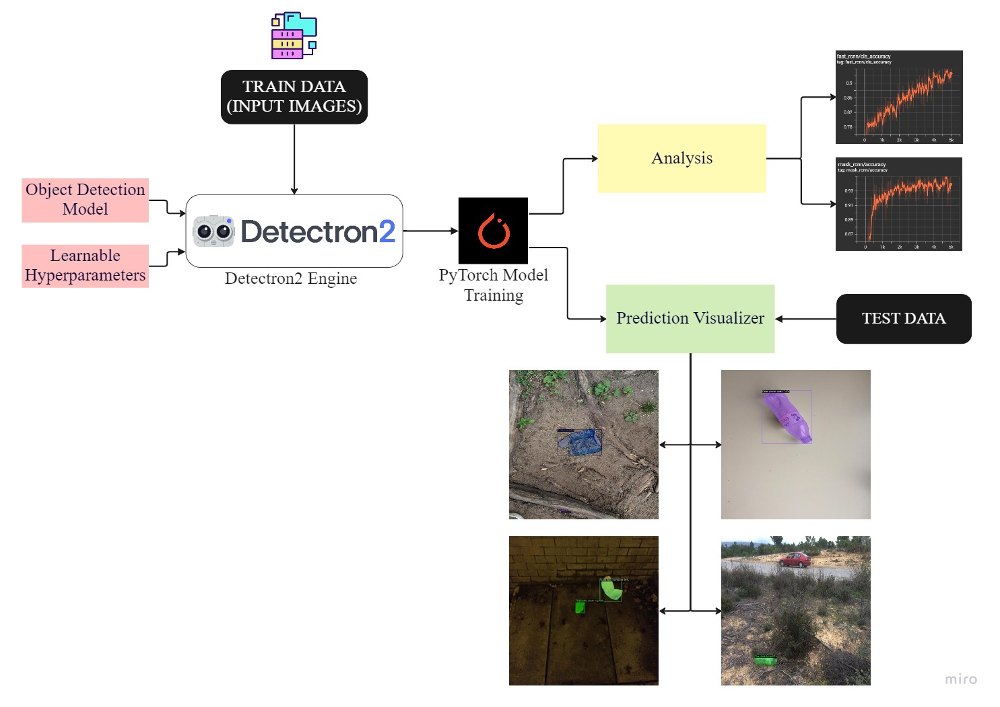
----

## Process Flow Diagram
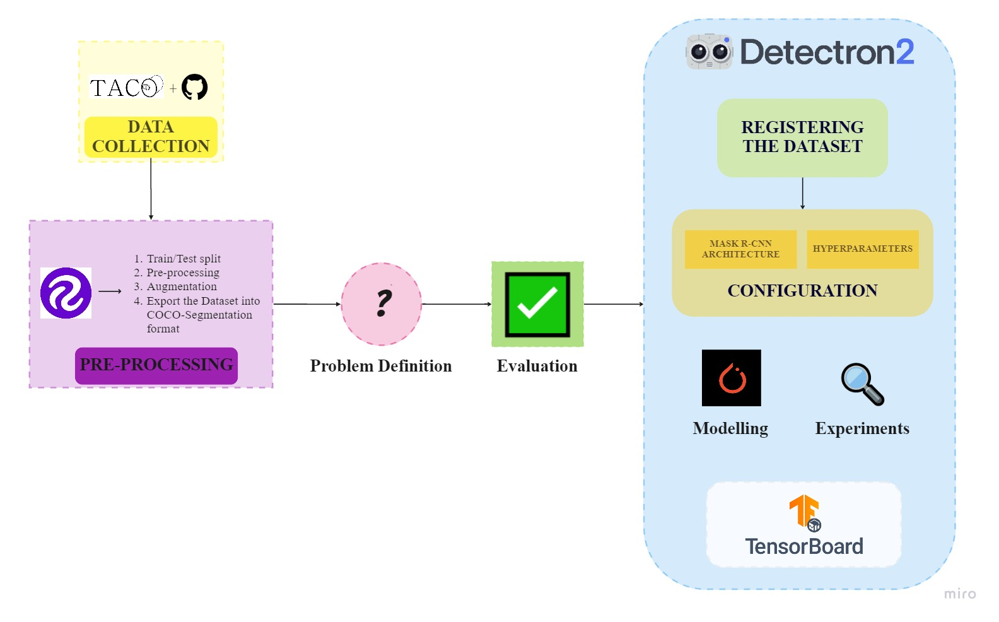


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Mini_Project/

/content/drive/MyDrive/Mini_Project


In [ ]:
!git clone https://github.com/pedropro/TACO.git
%cd TACO

Cloning into 'TACO'...
remote: Enumerating objects: 700, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 700 (delta 87), reused 95 (delta 63), pack-reused 580
Receiving objects: 100% (700/700), 95.59 MiB | 13.31 MiB/s, done.
Resolving deltas: 100% (464/464), done.
Checking out files: 100% (25/25), done.
/content/drive/.shortcut-targets-by-id/17XKj9_ZGyxnjQmaMIUba_2WT05dHYvfh/MiniProjectOld/TACO


In [ ]:
!pip install -r requirements.txt

In [ ]:
!python download.py

Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished


In [ ]:
%cd content/drive/MyDrive/MiniProjectOld/TACO/detector/
!python split_dataset.py --dataset_dir ../data

In [ ]:
%cd /content/drive/MyDrive/Mini_Project/
!git clone https://github.com/facebookresearch/detectron2.git

/content/drive/MyDrive/Mini_Project
Cloning into 'detectron2'...
remote: Enumerating objects: 14641, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 14641 (delta 19), reused 37 (delta 11), pack-reused 14584
Receiving objects: 100% (14641/14641), 6.00 MiB | 5.52 MiB/s, done.
Resolving deltas: 100% (10575/10575), done.
Checking out files: 100% (819/819), done.


In [ ]:
%cd /content/drive/MyDrive/Mini_Project/detectron2/
!pip install -e .

/content/drive/MyDrive/Mini_Project/detectron2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/drive/MyDrive/Mini_Project/detectron2
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 79 kB 10.0 MB/s 
     |████████████████████████████████| 153 kB 63.1 MB/s 
     |████████████████████████████████| 1.5 MB 67.3 MB/s 
     |████████████████████████████████| 549 kB 68.4 MB/s 
     |████████████████████████████████| 117 kB 70.8 MB/s 
     |████████████████████████████████| 96 kB 7.4 MB/s 
     |████████████████████████████████| 182 kB 66.5 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221213-py3-none-any.whl size=61498 sha256=60f634fd8d7f5f90de23723d8bd00f8053eecfbef9a9f17e10b61cbbc8ee0560
  Stored in directory: /root/.cache/pip/wheels/14/6d/5c/4fd3efe9b62aeae1e7e68204b54487df288e58e28f3d13fa1e
  Created wheel for antlr4-python3-runtime: filename=antlr4_p

In [ ]:
import os
import json
import glob as glob
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns

import cv2
import tensorflow as tf
import torch

SEED = 42
np.random.seed(SEED)

import warnings
warnings.filterwarnings('ignore')

## Hyperparameters and Constants
Here, we define whether to train the model or not and for how many epochs to train it.

If `TRAIN = False`, then the last trained model will be used for inference in the notebook if run end to end.

In [ ]:
TRAIN = True

# Number of epochs to train for
EPOCHS = 50

In [ ]:
dataset_path = '/content/drive/MyDrive/Mini_Project/TACO/data'
anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


## 1. Dataset Statistics

This shows the number of annotations per category:

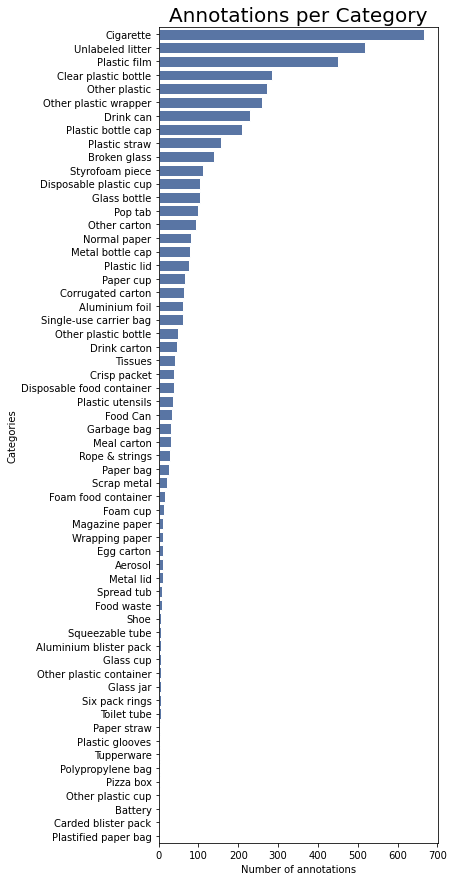

In [ ]:
# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the Categories
sns.set_color_codes("pastel")
sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b", orient="h")
plt.title("Annotations per Category",loc='center',y=1,fontdict={'fontsize':20});
plt.show();

# fig = plot_1.get_figure()
# fig.savefig("output.png")

and this shows the number of annotations per super category:

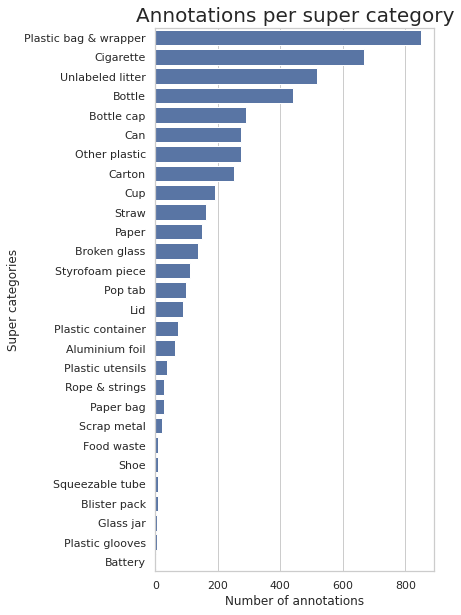

In [ ]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', 0, False)

sns.set_color_codes("pastel")
sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b", orient="h")
plot_1.set_title('Annotations per super category',fontsize=20);
plt.show();   

## 1.1  Background stats

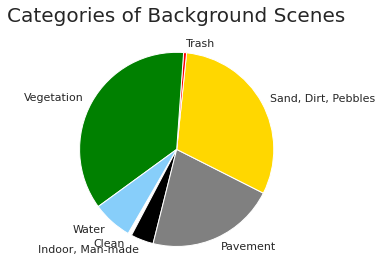

In [ ]:
# Get scene cat names
scene_cats = dataset['scene_categories']
scene_name = []
for scene_cat in scene_cats:
    scene_name.append(scene_cat['name'])

nr_scenes = len(scene_cats)
scene_cat_histogram = np.zeros(nr_scenes,dtype=int)

for scene_ann in dataset['scene_annotations']:    
    scene_ann_ids = scene_ann['background_ids']
    for scene_ann_id in scene_ann_ids:
        if scene_ann_id<len(scene_cats):
            scene_cat_histogram[scene_ann_id]+=1

# Convert to DataFrame
df = pd.DataFrame({'scene_cats': scene_cats, 'nr_annotations': scene_cat_histogram})
 
# Plot
colors = ['white','black','gray', 'gold', 'red','green','lightskyblue']
plt.pie(scene_cat_histogram, labels=scene_name, colors = colors,
      shadow=False, startangle=-120)
plt.title("Categories of Background Scenes",pad=20,fontdict={'fontsize':20,'fontweight':12})
 
plt.axis('equal')
plt.show()

## 2. Visualize dataset graph

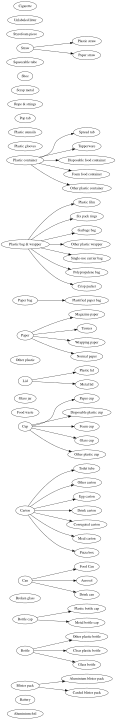

In [ ]:
from graphviz import Digraph
# Note: graphviz may require more than pip installation due to path issue: e.g. brew install graphviz for mac

#g = Digraph('G', filename='hello.gv')
dot = Digraph('Dataset graph', filename='asd.gv')
dot.attr(rankdir='LR', size='8,10')

for cat_it in categories:
    dot.node(cat_it['name'])
    if cat_it['name']==cat_it['supercategory']:
        dot.node(cat_it['supercategory'])
    else:
        dot.edge(cat_it['supercategory'], cat_it['name'])
dot
# Uncomment next line to print pdf
# dot.view()

## 3. Visualize Annotated Images
For simplicity, to select and show the dataset images with the respective masks, we make use of the COCO API. The script below shows how to load and visualize an image with all its annotations.

Unfortunately, several python libraries do not take into account the EXIF orientation tag, thus we have to explicitly rotate the images. Alternatively you can use instead OpenCV.

In [ ]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
image_filepath = 'batch_15/000000.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()

The script below shows how to filter images by either category or supercategory.

Go ahead and try different (super)categories searches by changing the category_name. Note that small objects may be hard to see.

In [ ]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
nr_img_2_display = 10
category_name = 'Cigarette'        # Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds)
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)])

for img in imgs:
    image_path = dataset_path + '/' + img['file_name']
    # Load image
    I = Image.open(image_path)
    
    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)
    
    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()

In [ ]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
nr_img_2_display = 10
category_name = 'Normal paper'    # Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds)
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)])

for img in imgs:
    image_path = dataset_path + '/' + img['file_name']
    # Load image
    I = Image.open(image_path)
    
    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)
    
    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show() 

In [ ]:
%cd /content/drive/MyDrive/Mini_Project/

/content/drive/MyDrive/Mini_Project


In [ ]:
!mkdir taco_dataset
%cd /content/drive/MyDrive/Mini_Project/taco_dataset/

/content/drive/MyDrive/Mini_Project/taco_dataset


In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 567 kB/s 
     |████████████████████████████████| 67 kB 6.6 MB/s 
     |████████████████████████████████| 178 kB 64.1 MB/s 
     |████████████████████████████████| 138 kB 68.8 MB/s 
     |████████████████████████████████| 145 kB 40.6 MB/s 
     |████████████████████████████████| 54 kB 3.7 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=a3e8414c9e9062711660567180b0ed63e323f95f9526dd2c9ece78df8c701084
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certi

In [ ]:
!pip install wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 10.4 MB/s 
     |████████████████████████████████| 182 kB 28.2 MB/s 
     |████████████████████████████████| 168 kB 67.9 MB/s 
     |████████████████████████████████| 62 kB 1.9 MB/s 
     |████████████████████████████████| 140 kB 53.4 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=a1f54f5caf52e0737099e88cd06032cb8f1eb0b8ee3b52c4bde1dcfb2a118e0a
  Stored in directory: /root/.cache/pip/wheels/4c/8e/7e/72fbc243e1aeecae64a96875432e70d4e92f3d2d18123be004
Successfully built pathtools
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.26.6
    Uninstalling urllib3-1.26.6:
      Successfully uninstalled urllib3-1.26.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency

In [ ]:
# #version-2 -- original
from roboflow import Roboflow
rf = Roboflow(api_key="timmBTcYgPDTNjNmJbFf")
project = rf.workspace("waste-classification-i60om").project("taco-3mxm9")
dataset = project.version(2).download("yolov7")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to taco-2 in yolov7pytorch:: 100%|██████████| 3012/3012 [00:50<00:00, 59.66it/s] 


In [ ]:
#version-1 -- Pre-processed & Augmented data
# from roboflow import Roboflow
# rf = Roboflow(api_key="timmBTcYgPDTNjNmJbFf")
# project = rf.workspace("waste-classification-i60om").project("taco-3mxm9")
# dataset = project.version(1).download("yolov7")

In [ ]:
%cd /content/drive/MyDrive/Mini_Project/yolov7-mask//

/content/drive/MyDrive/Mini_Project/yolov7-mask


In [ ]:
# Necessary dependencies for Yolov7-Mask
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 13.5 MB/s 


In [ ]:
%cd /content/drive/MyDrive/MiniProject/yolov7-segmentation/

/content/drive/MyDrive/MiniProjectOld/yolov7-segmentation


## Helper Functions for Logging
Here, we write the helper functions that we need for logging of the results in the notebook while training the models.

Let's create our custom result directories so that we can easily keep track of them and carry out inference using the proper model.

In [ ]:
def set_res_dir():
  # Directory to store results
  res_dir_count = len(glob.glob('runs/train/*'))
  print(f"Current number of result directories: {res_dir_count}")
  if TRAIN:
    RES_DIR = f"results_{res_dir_count}"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

## <strong>Function to Monitor TensorBoard Logs</strong>


In [ ]:
def monitor_tensorboard():
  %load_ext tensorboard
  %tensorboard --logdir runs/train-seg

In [ ]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
%cd /content/drive/MyDrive/Mini_Project/

/content/drive/.shortcut-targets-by-id/17XKj9_ZGyxnjQmaMIUba_2WT05dHYvfh/MiniProjectOld


In [ ]:
# Image Segmentation using Yolov5

# !git clone https://github.com/RizwanMunawar/yolov7-segmentation.git
# %cd yolov7-segmentation
# !pip install --upgrade pip

Cloning into 'yolov7-segmentation'...
remote: Enumerating objects: 449, done.
remote: Counting objects: 100% (133/133), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 449 (delta 82), reused 100 (delta 55), pack-reused 316
Receiving objects: 100% (449/449), 5.11 MiB | 14.05 MiB/s, done.
Resolving deltas: 100% (219/219), done.
/content/drive/.shortcut-targets-by-id/17XKj9_ZGyxnjQmaMIUba_2WT05dHYvfh/MiniProjectOld/yolov7-segmentation
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.1 MB 5.1 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 177 kB 15.6 MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110474 sha256=d0da5202955a222b222c1a57c4b4d7cfe98e7fda0355933cc42499db4f7d0706
  Stored in directory: /root/.cache/pip/wheels/fe/f6/cb/40331472edf4fd399b8cad02973c6acbdf26898342928327fe
Successfully built filterpy


In [ ]:
%cd /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/

/content/drive/.shortcut-targets-by-id/17XKj9_ZGyxnjQmaMIUba_2WT05dHYvfh/MiniProjectOld/yolov7-segmentation


In [ ]:
# Image Segmentation Version - Yolov5
RES_DIR = set_res_dir()

if TRAIN:
  !python segment/train.py --data data/custom.yaml --batch 4  --weights 'yolov7-seg.pt' \
   --cfg yolov7-seg.yaml --epochs {EPOCHS} \
   --name yolov7-seg --img 640 --hyp hyp.scratch-high.yaml --name {RES_DIR} --resume

Current number of result directories: 0
results_0
wandb: Currently logged in as: senthilkumarn (nsk). Use `wandb login --relogin` to force relogin
segment/train: weights=yolov7-seg.pt, cfg=yolov7-seg.yaml, data=data/custom.yaml, hyp=hyp.scratch-high.yaml, epochs=50, batch_size=4, imgsz=640, rect=False, resume=True, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train-seg, name=results_0, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, mask_ratio=4, no_overlap=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_

## Visualization & Inference utilities

We will visualize the validation prediction images that are saved during training.

In [ ]:
# Function to show validation predictions saved during training
def show_valid_results(RES_DIR):
  !ls runs/train/{RES_DIR}
  EXP_PATH = f"runs/train-seg/{RES_DIR}"
  validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
  print(validation_pred_images)
  for pred_image in validation_pred_images:
    image = cv2.imread(pred_image)
    plt.figure(figsize=(19,16))
    plt.imshow(image[:,:, ::-1])
    plt.axis('off')
    plt.show()

The following functions are for carrying out inference on images and videos.

In [ ]:
# Helper function for inference on images. 
def inference(RES_DIR,data_path):
  # Directory to store inference results
  infer_dir_count = len(glob.glob('runs/detect/*'))
  print(f"Current number of inference detection directories: {infer_dir_count}")
  INFER_DIR = f"inference_{infer_dir_count+1}"
  print(INFER_DIR)
  # Inference on images
  !python segment/predict.py --weights runs/train-seg/{RES_DIR}/weights/best.pt \
  --source {data_path} --name {INFER_DIR}
  return INFER_DIR

We may also need to visualize images in any of the directories. The following accepts a directory path and plots all the images in them.

In [ ]:
rnd_array = np.random.randint(0,50,size=10)

In [ ]:
def visualize(INFER_DIR):
  # Visualize inference images.
  INFER_PATH = f"runs/predict-seg/{INFER_DIR}"
  infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
  for i, pred_images in enumerate(infer_images):
    if i == 4:
      break
    image = cv2.imread(infer_images[rnd_array[i]])
    plt.figure(figsize=(12,9))
    plt.imshow(image[:,:, ::-1])
    plt.axis('off')
    plt.show()

**Visualize validation prediction images**

ls: cannot access 'runs/train/results_0': No such file or directory
['runs/train-seg/results_0/val_batch0_pred.jpg', 'runs/train-seg/results_0/val_batch1_pred.jpg', 'runs/train-seg/results_0/val_batch2_pred.jpg']


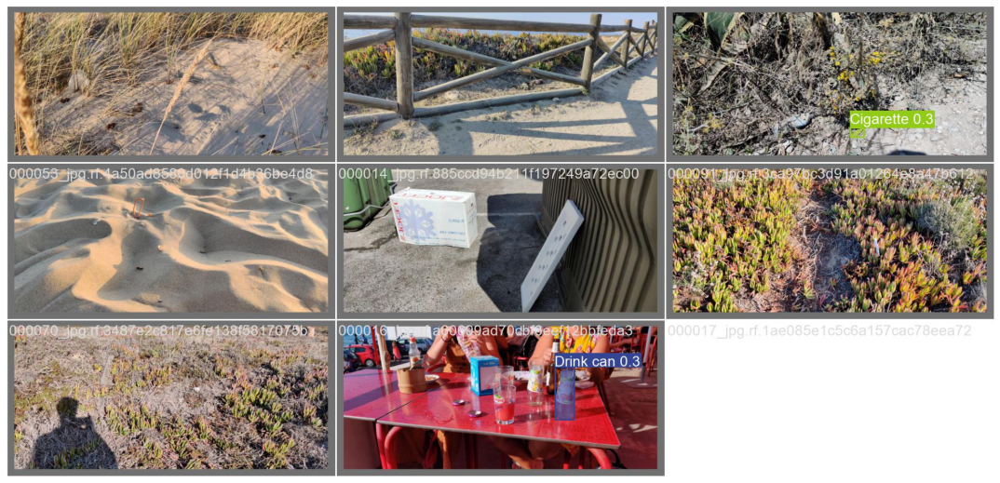

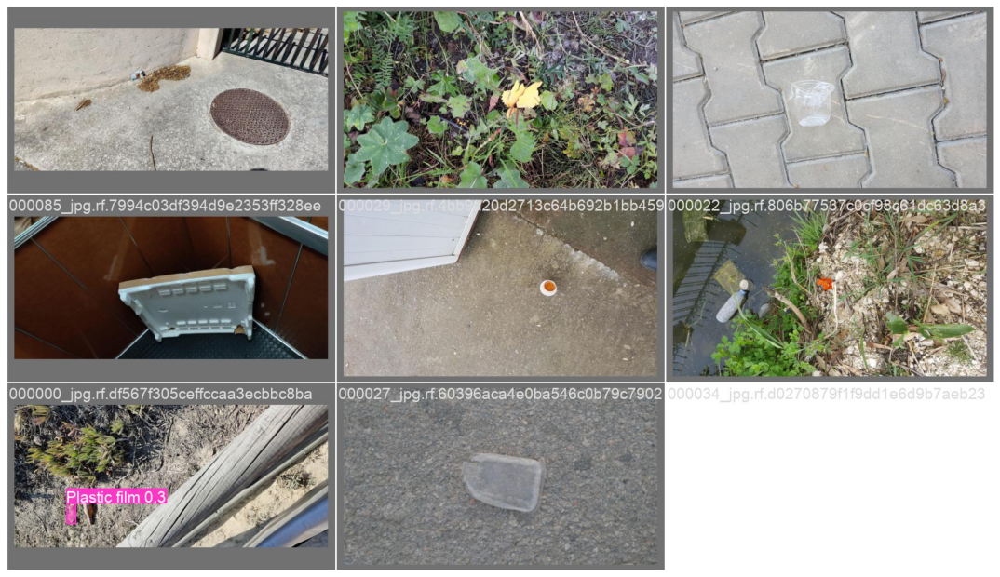

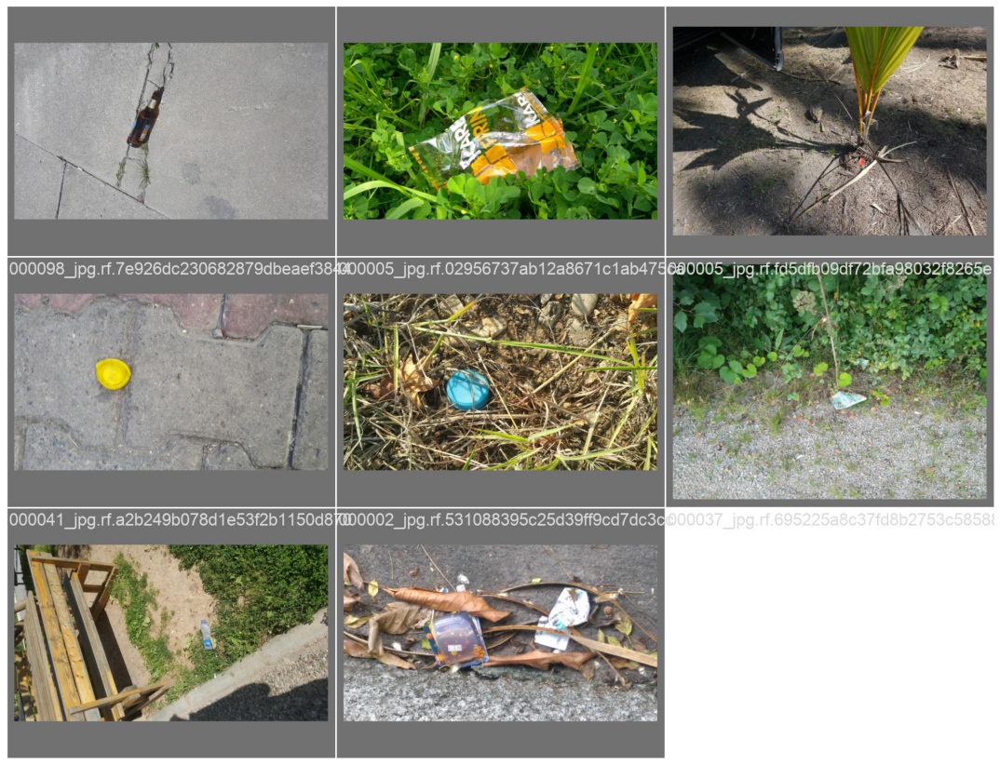

In [ ]:
show_valid_results(RES_DIR)

## Inference on Images

**To carry out inference on images, we just need to provide the directory path where all the images are stored, and inference will happen on all images automatically**

In [ ]:
!pip install matplotlib==2.2.4

In [ ]:
# Inference on images
IMAGE_INFER_DIR = inference(RES_DIR,'/content/drive/MyDrive/MiniProject/taco_dataset/taco-2/test/images/')

Current number of inference detection directories: 0
inference_1
/content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/utils/plots.py:30: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'TkAgg' by the following code:
  File "segment/predict.py", line 12, in <module>
    from sort_count import *
  File "/content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/segment/sort_count.py", line 41, in <module>
    import matplotlib.pyplot as plt
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/pyplot.py", line 71, in <module>
    from matplotlib.backends import pylab_setup
  File "/usr/local/lib/python3.8/dist-packages/matplotlib/backends/__init__.py", line 17, in <module>
    line for line in traceback.format_stack()


  matplotlib.use('Agg')  # for writing to files on

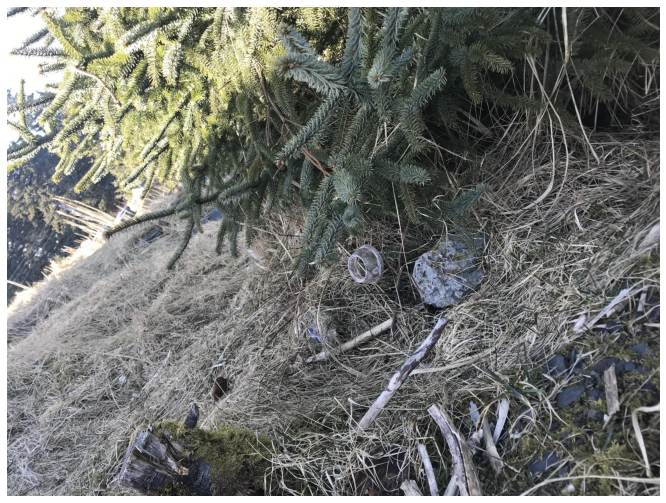

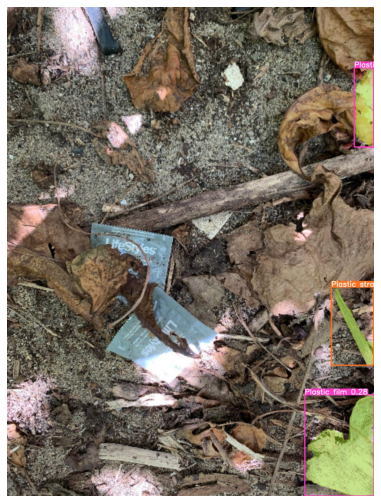

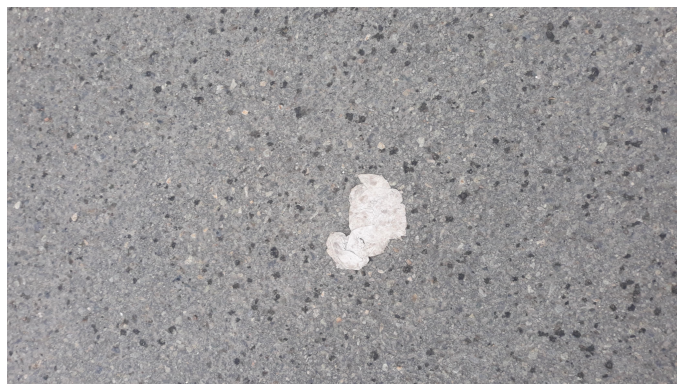

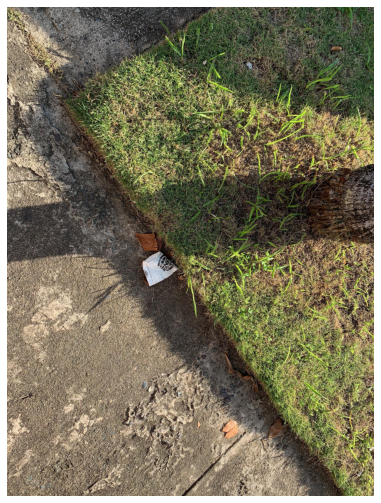

In [ ]:
visualize(IMAGE_INFER_DIR)

In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "5.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=5.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/5.jpg: 640x480 (no detections), 46.6ms
Speed: 0.7ms pre-process, 46.6ms inference, 0.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp2


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "1.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/1.jpg: 448x640 (no detections), 48.5ms
Speed: 0.7ms pre-process, 48.5ms inference, 0.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp3


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "2.jpeg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=2.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/2.jpeg: 384x640 (no detections), 41.0ms
Speed: 0.6ms pre-process, 41.0ms inference, 0.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp5


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "3.jpeg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=3.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/3.jpeg: 384x640 1 Clear plastic bottle, 41.1ms
Speed: 0.7ms pre-process, 41.1ms inference, 1.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp6


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "4.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=4.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/4.jpg: 320x640 (no detections), 38.0ms
Speed: 0.6ms pre-process, 38.0ms inference, 0.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp4


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "Tirunelveli shows the way towards managing plastic waste.mp4"

Streaming output truncated to the last 5000 lines.
video 1/1 (1980/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/Tirunelveli shows the way towards managing plastic waste.mp4: 384x640 (no detections), 21.2ms
video 1/1 (1981/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/Tirunelveli shows the way towards managing plastic waste.mp4: 384x640 (no detections), 20.9ms
video 1/1 (1982/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/Tirunelveli shows the way towards managing plastic waste.mp4: 384x640 (no detections), 21.0ms
video 1/1 (1983/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/Tirunelveli shows the way towards managing plastic waste.mp4: 384x640 (no detections), 20.7ms
video 1/1 (1984/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/Tirunelveli shows the way towards managing plastic waste.mp4: 384x640 (no detections), 21.8ms
video 1/1 (1985/6977) /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation

In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "10.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=10.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/10.jpg: 448x640 (no detections), 48.5ms
Speed: 0.6ms pre-process, 48.5ms inference, 0.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp8


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "11.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=11.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/11.jpg: 320x640 (no detections), 38.1ms
Speed: 0.5ms pre-process, 38.1ms inference, 0.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp9


In [ ]:
!python segment/predict.py --weights "runs/train-seg/results_0/weights/best.pt" --source "12.jpg"

segment/predict: weights=['runs/train-seg/results_0/weights/best.pt'], source=12.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-30-g5c23d62 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 325 layers, 38155328 parameters, 0 gradients, 142.9 GFLOPs
image 1/1 /content/drive/MyDrive/MiniProjectOld/yolov7-segmentation/12.jpg: 480x640 (no detections), 50.3ms
Speed: 0.7ms pre-process, 50.3ms inference, 0.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/predict-seg/exp10


In [ ]:
!wandb login

/bin/bash: wandb: command not found


In [ ]:
# Version-2 -- Original dataset -- Result-1
# RES_DIR = set_res_dir()

# if TRAIN:
#   !python train.py --data /content/drive/MyDrive/MiniProjectOld/taco_dataset/taco-2/data.yaml --device 0 \
#    --weights yolov7.pt --cfg cfg/training/yolov7.yaml --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 1
results_1
YOLOR 🚀 v0.1-115-g072f76c torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7.yaml', data='/content/drive/MyDrive/MiniProjectOld/taco_dataset/taco-2/data.yaml', device='0', entity=None, epochs=10, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='results_1', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/results_1', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparame

In [ ]:
# Version-2 -- Original dataset -- Result-2
RES_DIR = set_res_dir()

if TRAIN:
  !python train.py --data data/taco.yaml --device 0 \
   --weights yolov7.pt --cfg cfg/training/custom_yolov7.yaml --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 2
results_2
YOLOR 🚀 v0.1-115-g072f76c torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/custom_yolov7.yaml', data='data/taco.yaml', device='0', entity=None, epochs=10, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.p5.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='results_2', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/results_2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weigh

In [ ]:
# Version-3 -- Original dataset
RES_DIR = set_res_dir()

if TRAIN:
  !python train.py --data data/data.yaml --device 0 \
  --weights yolov7-mask.pt --cfg cfg/yolov7-mask.yaml --img 640 \
  --epochs {EPOCHS} --batch-size 16 --hyp data/hyp.scratch.mask.yaml --name {RES_DIR} 

Current number of result directories: 2
results_2
YOLOR 🚀 2022-9-28 torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/yolov7-mask.yaml', data='data/data.yaml', device='0', entity=None, epochs=50, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.mask.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='results_2', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/results_2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='yolov7-mask.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs

In [ ]:
# RES_DIR = set_res_dir()

# if TRAIN:
#   !python train.py --data /content/drive/MyDrive/MiniProject/taco_roboflow/taco-1/data.yaml --device 0 \
#    --weights yolov7.pt --cfg cfg/training/yolov7.yaml --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

In [ ]:
!nvidia-smi

Mon Dec  5 11:26:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8     9W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
torch.version.cuda

'11.3'

In [ ]:
torch.cuda.get_device_name(0)

'Tesla T4'

In [ ]:
os.getcwd()

'/content/drive/MyDrive/MiniProject/yolov7'

In [ ]:
%cd /content/drive/MyDrive/MiniProject/TACO/detector/

/content/drive/MyDrive/MiniProject/TACO/detector


In [ ]:
os.getcwd()

'/content/drive/MyDrive/MiniProject/TACO/detector'

In [ ]:
!pip install alfred-py
!pip install nbnb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 7.6 MB/s 
     |████████████████████████████████| 58 kB 7.1 MB/s 
     |████████████████████████████████| 60 kB 8.4 MB/s 
     |████████████████████████████████| 45 kB 3.2 MB/s 
  Created wheel for alfred-py: filename=alfred_py-3.0.3-py3-none-any.whl size=1873974 sha256=06c982c3d23575bf672034d204e7a5e686dbd49242966bfb1de4e48df8d86926
  Stored in directory: /root/.cache/pip/wheels/9d/1f/57/cd814c6d766bf347da9226f4ecbfa009d33be977818110dc5c
Successfully built alfred-py
ERROR: Operation cancelled by user
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 43 kB 1.6 MB/s 
  Using cached colorama-0.4.6-py2.py3-none-any.whl (25 kB)
     |████████████████████████████████| 237 kB 13.3 MB/s 
     |████████████████████████████████| 51 kB 7.6 MB/s 
  Created wheel for